In [4]:
from matplotlib import pyplot as plt
import ruptures as rpt
from tqdm.notebook import tqdm
import numpy as np
import transforms3d

import jax.numpy as jnp
from jax import grad, jit, vmap,jacrev
from jax import random
from jax.config import config

config.update("jax_debug_nans", True)

In [5]:
import pickle
import sys
import time 

def tic():
    return time.time()
def toc(tstart, nm=""):
    print('%s took: %s sec.\n' % (nm,(time.time() - tstart)))

def read_data(fname):
    d = []
    with open(fname, 'rb') as f:
        if sys.version_info[0] < 3:
            d = pickle.load(f)
        else:
            d = pickle.load(f, encoding='latin1')  # need for python 3
        return d


# Functions

In [62]:
def get_changepoints(imu1data):
    min_cuts,max_cuts = [],[]
    for i in tqdm(range(6)):
        algo = rpt.Pelt(model='rbf', min_size=3, jump=10).fit(imu1data['vals'][0])
        my_bkps = algo.predict(pen=3)
        min_cuts.append(min(my_bkps))
        max_cuts.append(max(my_bkps))
    print(min_cuts,max_cuts)
    return(int((min(min_cuts)*0.8)),int(max(max_cuts)+(imu1data['vals'].shape[1]-max(max_cuts))*0.2))

def plotImuData(ub_imu1data,ts = imu1data['ts'].T,):
    fig, axes = plt.subplots(2, 3, figsize=(16,12))
    for i in range(6):
        axes.flatten()[i].plot(ts,ub_imu1data[i])

# Constants

In [63]:
IMU_FOLDER = "../data/trainset/imu/"
CAM_FOLDER = "../data/trainset/cam/"
VICON_FOLDER = "../data/trainset/vicon/"

In [64]:
SENSITIVITY_ACC_MVPG = 300
SENSITIVITY_PRY_MVPDEGPS = 3.33
VREF_MV = 3300
EPS = 1e-6

In [65]:
imu1data = read_data(f'{IMU_FOLDER}imuRaw1.p')
vicon1data = read_data(f'{VICON_FOLDER}viconRot1.p')

# Calibration

  0%|          | 0/6 [00:00<?, ?it/s]

[790, 790, 790, 790, 790, 790] [5645, 5645, 5645, 5645, 5645, 5645]


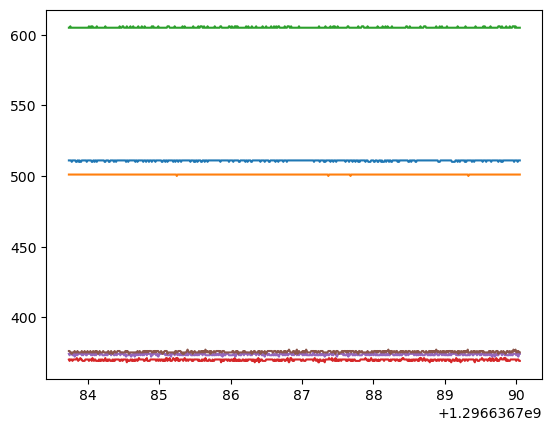

In [68]:
cp_l,cp_h = get_changepoints(imu1data)
print(cp_l,cp_h)
for i in range(6):
    plt.plot(imu1data['ts'].T[:cp_l],imu1data['vals'][i][:cp_l])

In [216]:
cp_l

632

In [71]:
bias = np.mean(imu1data['vals'][:,:cp_l],1)
scalef_acc = (VREF_MV/ SENSITIVITY_ACC_MVPG)/1023
scalef_rpy = (VREF_MV/ (SENSITIVITY_PRY_MVPDEGPS*(180/np.pi)))/1023
scalef = np.array([scalef_acc,scalef_acc,scalef_acc,scalef_rpy,scalef_rpy,scalef_rpy])
ub_imu1data = (imu1data['vals']-np.expand_dims(bias,-1))*np.expand_dims(scalef,-1)

scaled_imu1data = (imu1data['vals']*np.expand_dims(scalef,-1))
bias_scaled = np.mean(scaled_imu1data[:,:cp_l],1)
# ub_imu1data = scaled_imu1data-np.expand_dims(bias_scaled,-1)
ub_imu1data[2]+=1

In [72]:
print(f'bias {bias}')
print(f'scale factor {scalef}')
print(f'scaled bias {bias_scaled}')

bias [510.81329114 500.99367089 605.16139241 369.68037975 373.5664557
 375.37341772]
scale factor [0.01075269 0.01075269 0.01075269 0.01690719 0.01690719 0.01690719]
scaled bias [5.49261603 5.38702872 6.50711175 6.25025652 6.31595915 6.3465098 ]


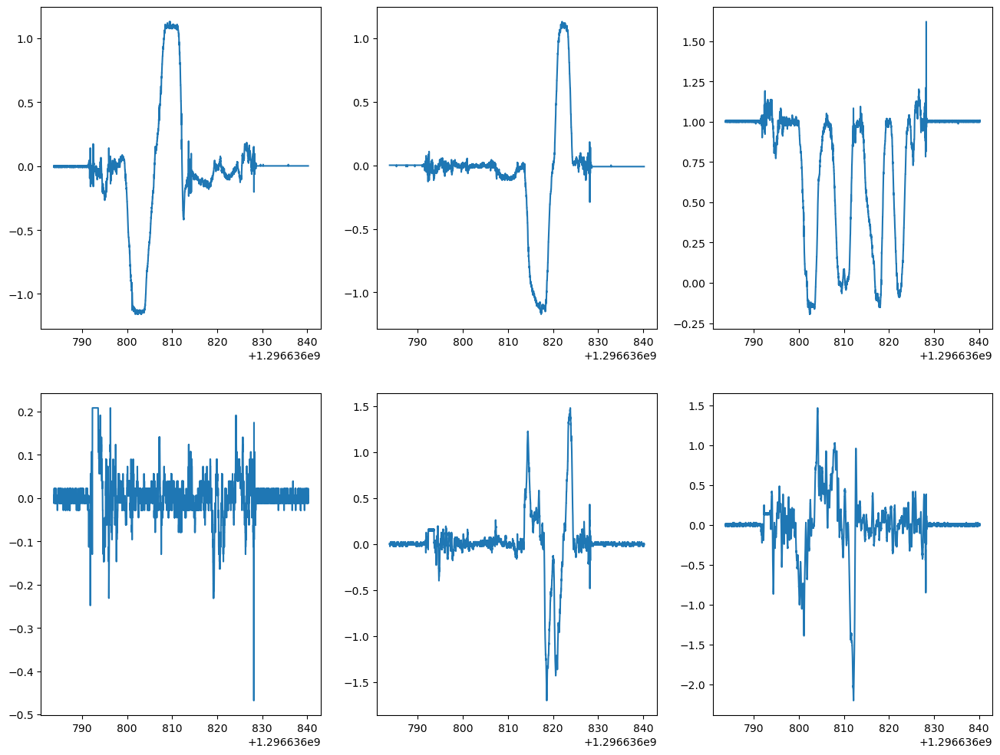

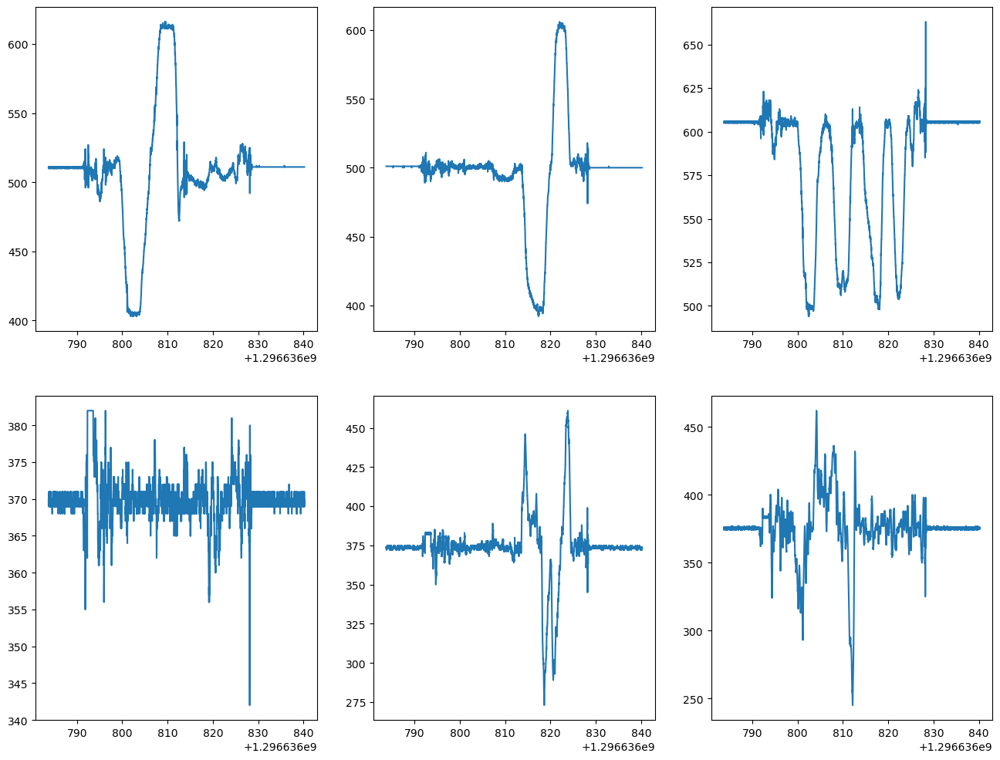

In [73]:
plotImuData(ub_imu1data,imu1data['ts'].T)
plotImuData(imu1data['vals'],imu1data['ts'].T)

# Quaternions

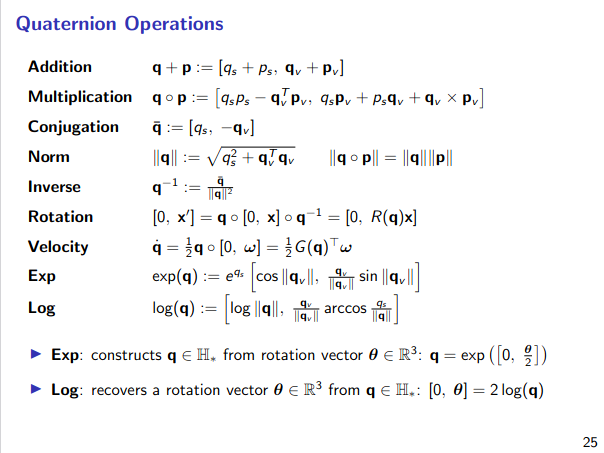

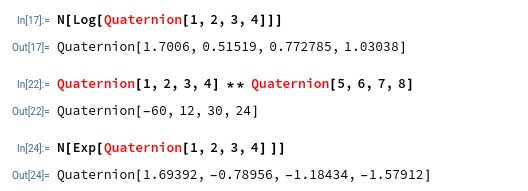

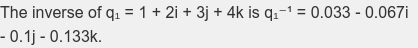

In [167]:
@jit
def qMult(q,p):
    qs = q[0]
    ps = p[0]
    qv = q[1:]
    pv = p[1:]
    return (jnp.hstack((jnp.array([qs*ps-jnp.dot(pv,qv)]),(qs*pv)+(ps*qv)+jnp.cross(qv,pv))))

@jit
def qLog(q):
    q+=EPS
    qs = q[0]
    qv = q[1:]
    norm = jnp.linalg.norm(q)
    return jnp.hstack((
        jnp.array([jnp.log(norm)]),
        (qv/(jnp.linalg.norm(qv)+EPS))*jnp.arccos(qs/(norm+EPS))
    ))

@jit
def qExp(q):
    qs = q[0]
    qv = q[1:]
    normv = jnp.linalg.norm(qv)
    mult = jnp.exp(qs)
    return mult*jnp.hstack((
        jnp.array([jnp.cos(normv)]),
        (qv/(normv+EPS))*jnp.sin(normv)
    ))

@jit
def qConjugate(q):
    return jnp.hstack((
        q[0:1],
        -q[1:]
    ))

@jit
def qInv(q):
    return(qConjugate(q)/((jnp.linalg.norm(q)**2)+EPS))

@jit
def qUnit(q):
    return(q/((jnp.linalg.norm(q))+EPS))
    

In [75]:

q = jnp.array([1,2,3,4])
p = jnp.array([5,6,7,8])
print(qMult(q,p))
print(qLog(q))
print(qExp(q))
print(qConjugate(q))
print(qInv(q))

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


[-60  12  30  24]
[1.700599  0.5151903 0.7727853 1.0303804]
[ 1.6939225  -0.78955954 -1.1843393  -1.5791191 ]
[ 1 -2 -3 -4]
[ 0.03333333 -0.06666666 -0.09999999 -0.13333331]


In [76]:
%env JAX_DEBUG_NANS=True
q = jnp.array([0,0,0,0])
jnp.linalg.norm(q)

env: JAX_DEBUG_NANS=True


Array(0., dtype=float32)

# Motion model

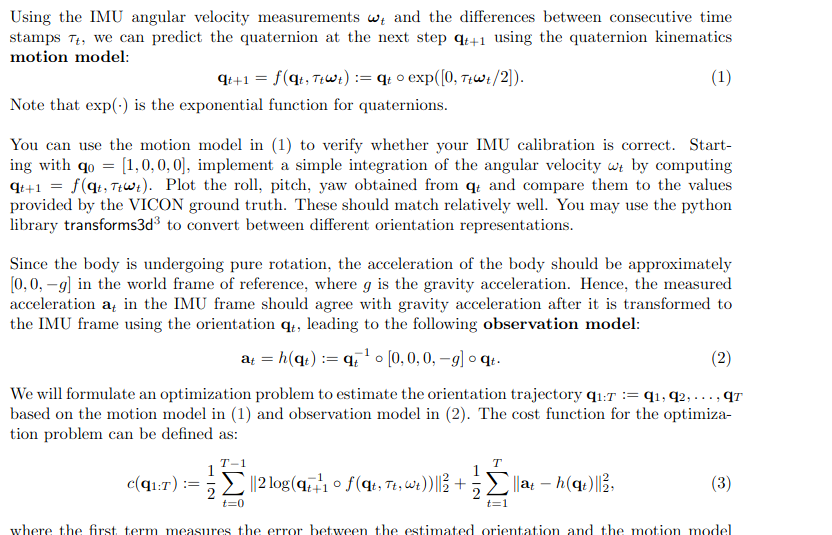

In [180]:
ub_imu1data

array([[ 2.00762216e-03,  2.00762216e-03,  2.00762216e-03, ...,
         2.00762216e-03,  2.00762216e-03,  2.00762216e-03],
       [ 6.80549884e-05,  6.80549884e-05,  6.80549884e-05, ...,
        -1.06846332e-02, -1.06846332e-02, -1.06846332e-02],
       [ 9.98264598e-01,  9.98264598e-01,  1.00901729e+00, ...,
         9.98264598e-01,  9.98264598e-01,  1.00901729e+00],
       [ 5.40388044e-03, -1.15033098e-02,  5.40388044e-03, ...,
        -1.15033098e-02, -1.15033098e-02, -1.15033098e-02],
       [ 7.33001604e-03, -9.57717424e-03,  7.33001604e-03, ...,
        -9.57717424e-03,  7.33001604e-03, -9.57717424e-03],
       [ 1.05937458e-02,  1.05937458e-02, -6.31344447e-03, ...,
        -6.31344447e-03,  1.05937458e-02, -6.31344447e-03]])

In [181]:
wt = ub_imu1data.T[0][3:]
dt = imu1data['ts'][0][1]-imu1data['ts'][0][0]
q0 = jnp.array([1,0,0,0])


In [182]:
ub_imu1data[3:].T

array([[ 0.00540388,  0.00733002,  0.01059375],
       [-0.01150331, -0.00957717,  0.01059375],
       [ 0.00540388,  0.00733002, -0.00631344],
       ...,
       [-0.01150331, -0.00957717, -0.00631344],
       [-0.01150331,  0.00733002,  0.01059375],
       [-0.01150331, -0.00957717, -0.00631344]])

In [183]:
ub_imu1data[3:].T[:,[1,2,0]]

array([[ 0.00733002,  0.01059375,  0.00540388],
       [-0.00957717,  0.01059375, -0.01150331],
       [ 0.00733002, -0.00631344,  0.00540388],
       ...,
       [-0.00957717, -0.00631344, -0.01150331],
       [ 0.00733002,  0.01059375, -0.01150331],
       [-0.00957717, -0.00631344, -0.01150331]])

In [184]:
def motionModelQ_tp1(qt,wt,dt):
    return qMult(qt,qExp(jnp.hstack((jnp.array([0]),(dt*jnp.array(wt))/2))))

def motionModel(ub_imu1data, dts):
    # wts = ub_imu1data[3:].T
    # wts = wts[:,[2,0,1]]
    # wts = ub_imu1data[3:].T
    wts = ub_imu1data[3:].T[:,[1,2,0]]
    
    qt = jnp.array([1,0,0,0])
    qts = [qt]
    qts_euler = [transforms3d.euler.quat2euler(qt)]
    for dt,wt in tqdm(zip(dts,wts[:-1]),total=dts.shape[0]):
        # wt = jnp.array([wt[1],wt[2],wt[0]])
        qt_p1 = motionModelQ_tp1(qt,wt,dt)
        qt = qt_p1
        qts+=[qt_p1]
        qts_euler+=[transforms3d.euler.quat2euler(qt_p1)]
    qts = jnp.vstack(qts)
    qts_euler = jnp.vstack(qts_euler)
    return qts,qts_euler

In [185]:
motionModelQ_tp1(jnp.array([5,6,7,8]),jnp.array([1,2,3]),0.02)

Array([4.556615 , 6.095774 , 6.9951005, 8.194348 ], dtype=float32)

In [186]:
ub_imu1data[:,-1]

array([ 0.00200762, -0.01068463,  1.00901729, -0.01150331, -0.00957717,
       -0.00631344])

In [187]:
viconEulers = []
for i in range(vicon1data['rots'].shape[2]):
    viconEulers+=[transforms3d.euler.mat2euler(vicon1data['rots'][...,i])]
viconEulers = np.vstack(viconEulers)


In [190]:
qts_init,qts_euler = motionModel(ub_imu1data,dts)
imuEulers = []
for qt in np.array(qts_init):
    imuEulers+=[transforms3d.euler.quat2euler(qt)]
imuEulers = np.vstack(imuEulers)

  0%|          | 0/5644 [00:00<?, ?it/s]

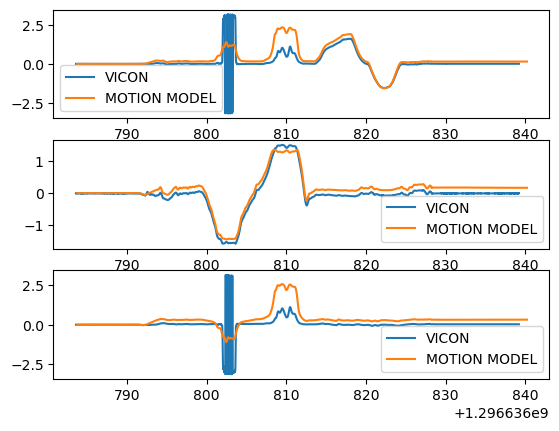

In [215]:
fig, axes = plt.subplots(3,1)
for i in range(3):
    axes.flatten()[i].plot(vicon1data['ts'][0],viconEulers[:,i],label="VICON")
    # axes.flatten()[i].plot(imu1data['ts'][0],imuEulers[:,i])    
    axes.flatten()[i].plot(imu1data['ts'][0],qts_euler[:,i],label='MOTION MODEL')
    axes.flatten()[i].legend()

# Observation Model

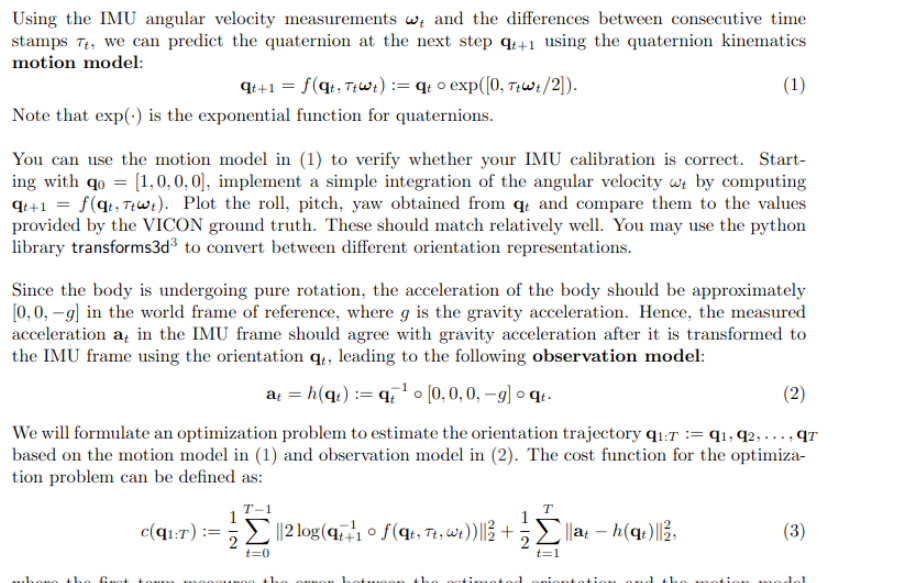

In [168]:
def h(qt):
    return qMult(qMult(qInv(qt),jnp.array([0,0,0,1])),qt)

def cost_sec_summation(at,qt):
    # (ub_imu1data[:3,0]*jnp.array([-1,-1,1]))-h(qts[0])[1:]
    return jnp.linalg.norm(at-h(qt)[1:])**2

def cost_fir_summation(qt_p1,qt,dt,wt):
    logTerm = qMult(qInv(qt_p1),motionModelQ_tp1(qt,wt,dt))
    term = qLog(logTerm+EPS)
    return (2*jnp.linalg.norm(term))**2

In [162]:
h(jnp.array([1,2,3,4]))

Array([1.4901161e-08, 3.3333325e-01, 9.3333316e-01, 1.3333327e-01],      dtype=float32)

In [163]:
qts[9]

Array([ 9.9999851e-01, -3.3985834e-05,  9.9811261e-04,  6.5284235e-05],      dtype=float32)

In [142]:
(ub_imu1data[:3].T*jnp.array([-1,-1,1]))[:,0]

Array([-0.00200762, -0.00200762, -0.00200762, ..., -0.00200762,
       -0.00200762, -0.00200762], dtype=float32)

  0%|          | 0/5644 [00:00<?, ?it/s]

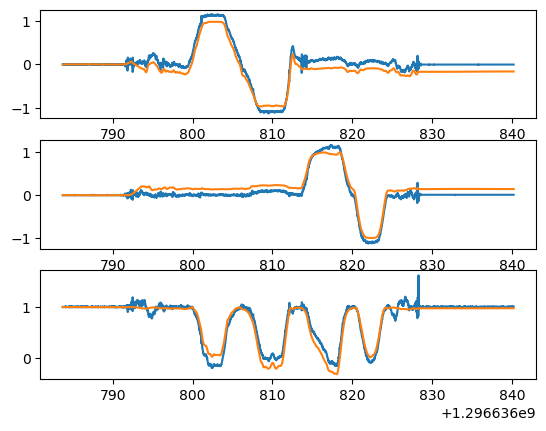

In [214]:
dts = (imu1data['ts'][0][1:]-imu1data['ts'][0][:-1])
qts_init,qts_euler = motionModel(ub_imu1data,dts)
fig, axes = plt.subplots(3, 1)
for i in range(3):
    axes.flatten()[i].plot(imu1data['ts'][0],(ub_imu1data[:3].T*jnp.array([-1,-1,1]))[:,i])
    axes.flatten()[i].plot(imu1data['ts'][0],jnp.apply_along_axis(h,1,qts_init)[:,i+1])
# plt.plot(ub_imu1data[:3].T*jnp.array([-1,-1,1]))
# plt.plot(jnp.apply_along_axis(h,1,qts_init))

In [143]:
# qts.shape,cost_sec_summation(x[:3],x[3:])
def cost_fn(qts,dts,ats):
    qt_p1s = qts[1:]
    qts_cf = qts[:-1]
    wts = ub_imu1data[3:][[1,2,0]].T[:-1]

    sum1 = jnp.sum(jnp.apply_along_axis(lambda x:cost_fir_summation(x[:4],x[4:8],x[8],x[9:]),1,
                                 jnp.hstack((qt_p1s,qts_cf,jnp.expand_dims(dts,-1),wts))                             
                                ))
    sum2 = jnp.sum(jnp.apply_along_axis(lambda x:cost_sec_summation(x[:3],x[3:]),1,jnp.hstack((ats,qts))))
    return 0.5*(sum1+sum2)

In [172]:
dts = (imu1data['ts'][0][1:]-imu1data['ts'][0][:-1])
ats = ub_imu1data[:3].T*jnp.array([-1,-1,1])

grad_cost_fn = jacrev(cost_fn)
pbar = tqdm(range(1000))
dts = (imu1data['ts'][0][1:]-imu1data['ts'][0][:-1])
qts_init,qts_euler = motionModel(ub_imu1data,dts)


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/5644 [00:00<?, ?it/s]

In [173]:
jacrev(cost_fn)(qts,dts,ats)


Array([[-1.7098071e-06,  1.4343881e-04,  1.8055027e-03,  4.0262542e-04],
       [ 3.3312538e-06,  1.0575039e-04, -5.1318356e-03, -2.6315125e-04],
       [-3.1324339e-06, -2.7120864e-04,  3.8387659e-03, -2.2377403e-04],
       ...,
       [ 5.2373953e-02, -3.9253765e-01,  9.1051096e-01, -3.3581650e-01],
       [-2.3715023e-05,  5.3490154e-03,  7.5875628e-03, -2.2953274e-04],
       [ 3.8595768e-05,  3.5959056e-03,  6.1440635e-03, -5.2627194e-04]],      dtype=float32)

  0%|          | 0/1000 [00:00<?, ?it/s]

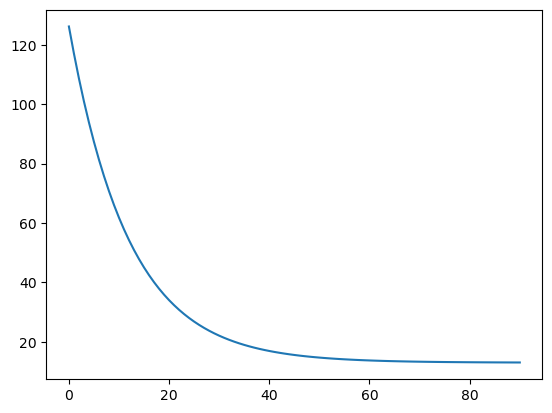

In [201]:
ALPHA = 0.01
qts = qts_init
prev_cf_val = cost_fn(qts,dts,ats)
cf_vals = []

pbar = tqdm(range(1000))
for i in pbar:
    qts = qts-(ALPHA*grad_cost_fn(qts,dts,ats))
    qts = jnp.apply_along_axis(qUnit,1,qts)
    # print(jnp.apply_along_axis(jnp.linalg.norm,1,qts))
    cf_val = cost_fn(qts,dts,ats)
    pbar.set_description(f'Cost fn {cf_val}')

    cf_vals+=[cf_val]
    if(prev_cf_val-cf_val<0.0004*prev_cf_val):
        break
    prev_cf_val = cf_val
plt.plot(cf_vals)
# for i in pbar:
#     grad_qts = grad_cost_fn(qts,dts)
#     qts

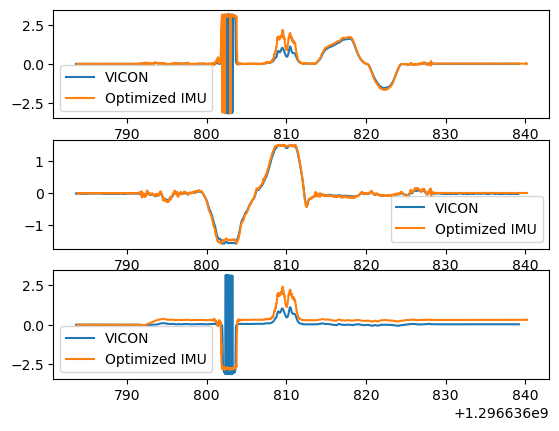

In [213]:
optImuEulers = []
for qt in np.array(qts):
    optImuEulers+=[transforms3d.euler.quat2euler(qt)]
optImuEulers = np.vstack(optImuEulers)
fig, axes = plt.subplots(3,1)
for i in range(3):
    axes.flatten()[i].plot(vicon1data['ts'][0],viconEulers[:,i],label="VICON")
    axes.flatten()[i].plot(imu1data['ts'][0],optImuEulers[:,i],label = "Optimized IMU")    
    # axes.flatten()[i].plot(imu1data['ts'][0],qts_euler[:,i],label='MOTION MODEL')
    axes.flatten()[i].legend()

# Cutpoints for all figures

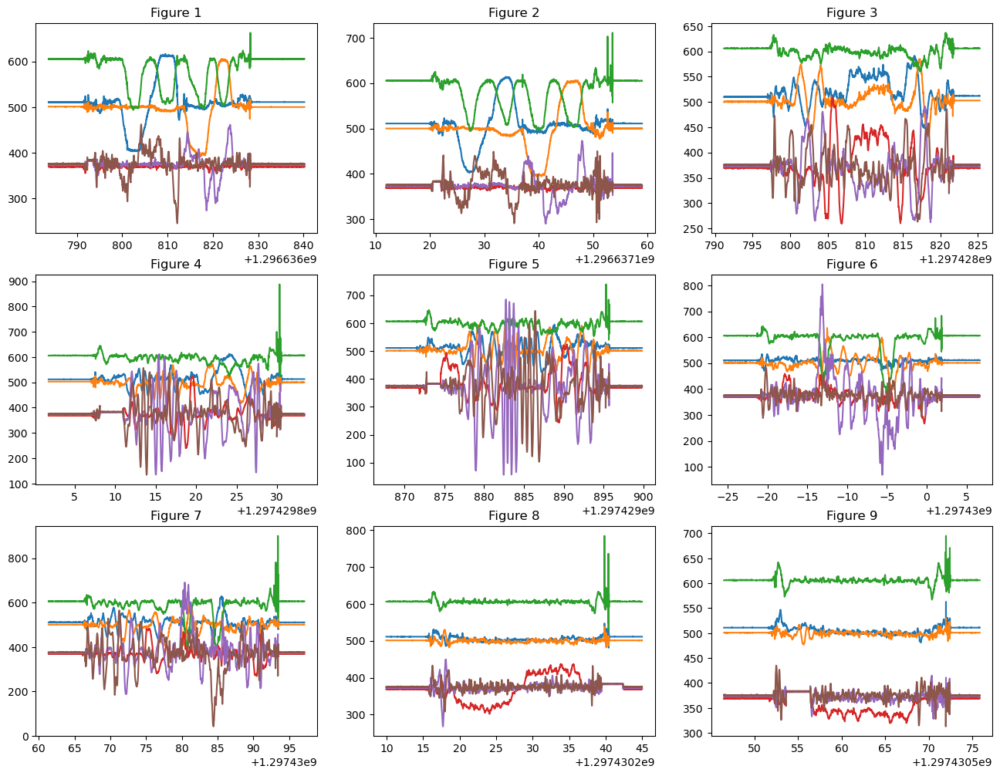

In [226]:
fig, axes = plt.subplots(3, 3, figsize=(16,12))
for k in range(1,10):
    imudata = read_data(f'{IMU_FOLDER}imuRaw{k}.p')
    for i in range(6):
        axes.flatten()[k-1].plot(imudata['ts'].T,imudata['vals'][i])
    axes.flatten()[k-1].set_title(f'Figure {k}')
fig.savefig('./figures/AllIMUDATA.jpg')

  0%|          | 0/6 [00:00<?, ?it/s]

[790, 790, 790, 790, 790, 790] [5645, 5645, 5645, 5645, 5645, 5645]
1 632 5645


  0%|          | 0/6 [00:00<?, ?it/s]

[900, 900, 900, 900, 900, 900] [4698, 4698, 4698, 4698, 4698, 4698]
2 720 4698


  0%|          | 0/6 [00:00<?, ?it/s]

[640, 640, 640, 640, 640, 640] [3404, 3404, 3404, 3404, 3404, 3404]
3 512 3404


  0%|          | 0/6 [00:00<?, ?it/s]

[640, 640, 640, 640, 640, 640] [3156, 3156, 3156, 3156, 3156, 3156]
4 512 3156


  0%|          | 0/6 [00:00<?, ?it/s]

[520, 520, 520, 520, 520, 520] [3210, 3210, 3210, 3210, 3210, 3210]
5 416 3210


  0%|          | 0/6 [00:00<?, ?it/s]

[460, 460, 460, 460, 460, 460] [3211, 3211, 3211, 3211, 3211, 3211]
6 368 3211


  0%|          | 0/6 [00:00<?, ?it/s]

[520, 520, 520, 520, 520, 520] [3577, 3577, 3577, 3577, 3577, 3577]
7 416 3577


  0%|          | 0/6 [00:00<?, ?it/s]

[580, 580, 580, 580, 580, 580] [3501, 3501, 3501, 3501, 3501, 3501]
8 464 3501


  0%|          | 0/6 [00:00<?, ?it/s]

[570, 570, 570, 570, 570, 570] [2931, 2931, 2931, 2931, 2931, 2931]
9 456 2931


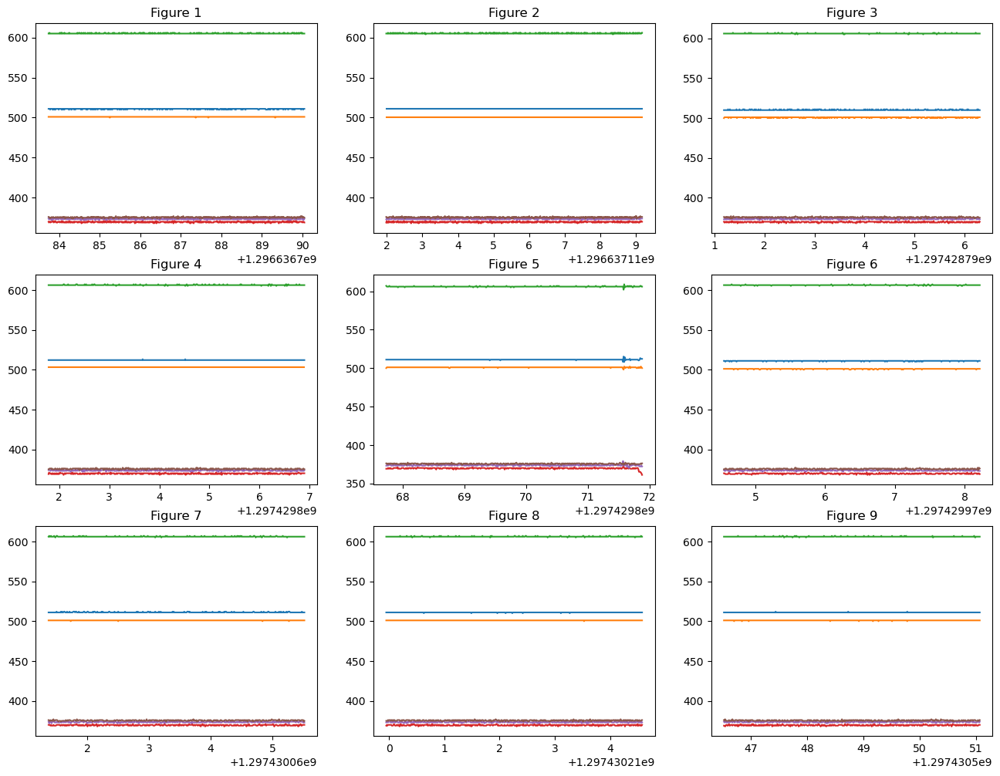

In [228]:
fig, axes = plt.subplots(3, 3, figsize=(16,12))
for k in range(1,10):
    imudata = read_data(f'{IMU_FOLDER}imuRaw{k}.p')
    cp_l,cp_h = get_changepoints(imudata)
    print(f'{k} {cp_l} {cp_h}')
    for i in range(6):
        axes.flatten()[k-1].plot(imudata['ts'].T[:cp_l],imudata['vals'][i][:cp_l])
    axes.flatten()[k-1].set_title(f'Figure {k}')
fig.savefig('./figures/Trimmed_AllIMUDATA.jpg')



In [229]:
cutData = {1:632,2:720,3:512,4:512,5:416,6:368,7:416,8:464,9:456}
for k in cutData:
    print(k,cutData[k])

1 632
2 720
3 512
4 512
5 416
6 368
7 416
8 464
9 456


In [231]:
np.array(qts)

array([[ 9.9999845e-01, -8.2328042e-05,  6.4182881e-04, -7.9731958e-04],
       [ 9.9999833e-01, -1.5577252e-05,  9.6825178e-04, -5.8654521e-04],
       [ 9.9999863e-01, -5.9296392e-05,  7.4600161e-04, -5.7980942e-04],
       ...,
       [ 9.8767358e-01,  6.4706858e-03,  4.0539806e-03,  1.5633529e-01],
       [ 9.8757321e-01,  6.4265123e-03,  4.0568653e-03,  1.5696989e-01],
       [ 9.8750949e-01,  6.4229690e-03,  4.1055302e-03,  1.5736902e-01]],
      dtype=float32)

array([[ 9.9999845e-01, -8.2328042e-05,  6.4182881e-04, -7.9731958e-04],
       [ 9.9999833e-01, -1.5577252e-05,  9.6825178e-04, -5.8654521e-04],
       [ 9.9999863e-01, -5.9296392e-05,  7.4600161e-04, -5.7980942e-04],
       ...,
       [ 9.8767358e-01,  6.4706858e-03,  4.0539806e-03,  1.5633529e-01],
       [ 9.8757321e-01,  6.4265123e-03,  4.0568653e-03,  1.5696989e-01],
       [ 9.8750949e-01,  6.4229690e-03,  4.1055302e-03,  1.5736902e-01]],
      dtype=float32)

# Cutpoints for test data

In [233]:
IMU_TEST_FOLDER = "../data/testset/imu/"
CAM_TEST_FOLDER = "../data/testset/cam/"

10 0
11 1


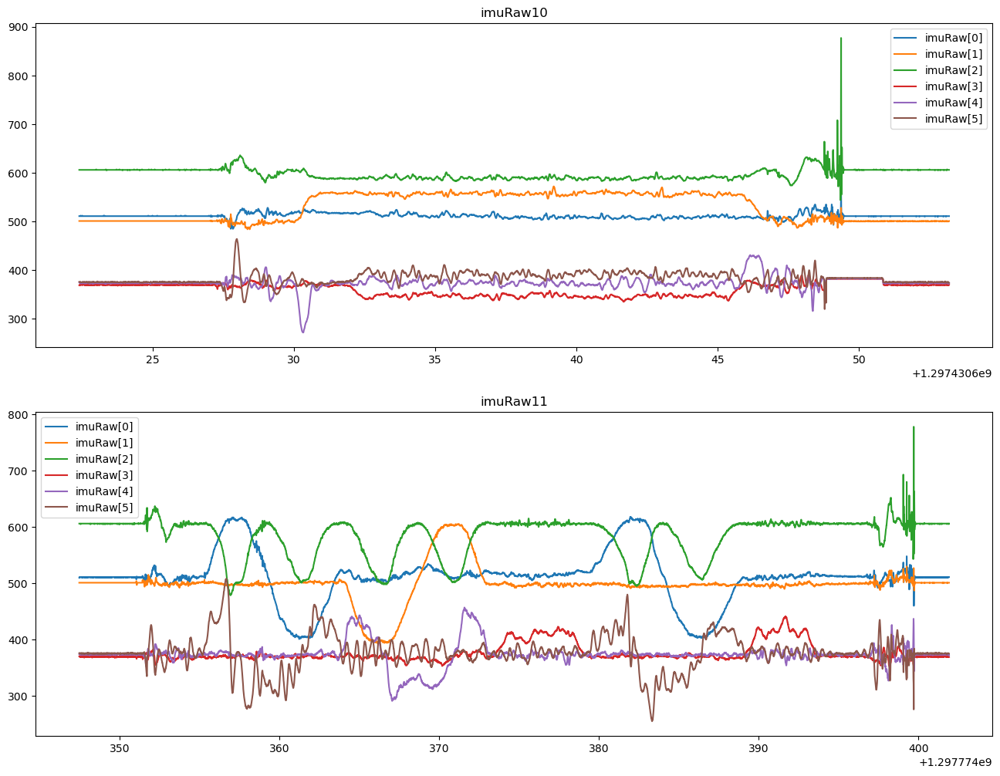

In [239]:
fig, axes = plt.subplots(2, 1, figsize=(16,12))
for k in range(10,12):
    imudata = read_data(f'{IMU_TEST_FOLDER}imuRaw{k}.p')
    print(k,k-10)
    for i in range(6):
        axes.flatten()[k-10].plot(imudata['ts'].T,imudata['vals'][i],label=f'imuRaw[{i}]')
    axes.flatten()[k-10].legend()
    axes.flatten()[k-10].set_title(f'imuRaw{k}')
fig.savefig('./figures/AllIMUDATATest.jpg')

  0%|          | 0/6 [00:00<?, ?it/s]

[510, 510, 510, 510, 510, 510] [3078, 3078, 3078, 3078, 3078, 3078]
10 408 3078


  0%|          | 0/6 [00:00<?, ?it/s]

[450, 450, 450, 450, 450, 450] [5441, 5441, 5441, 5441, 5441, 5441]
11 360 5441


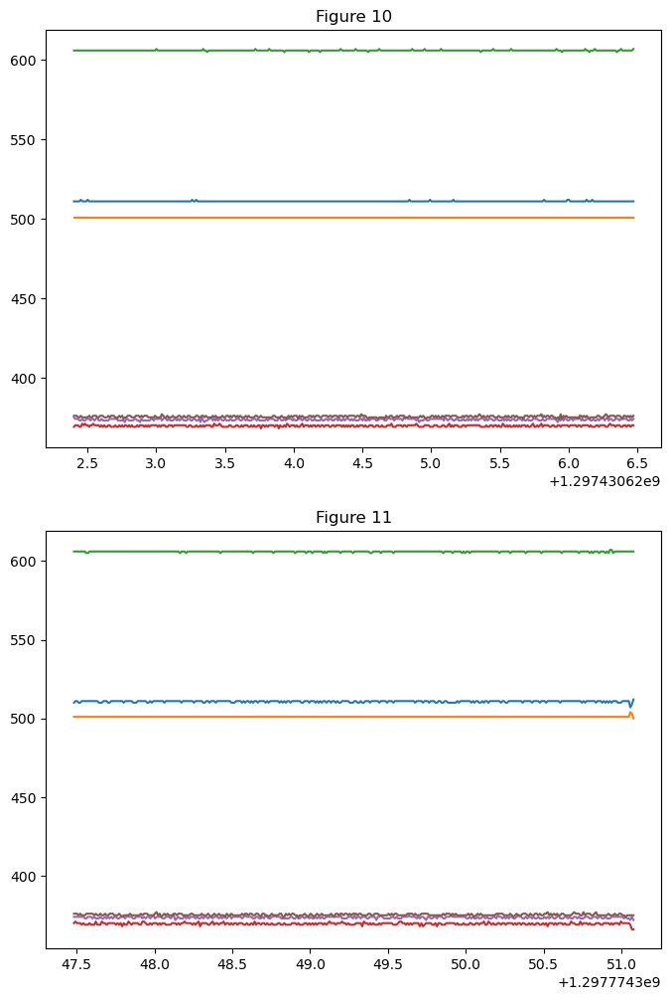

In [240]:
fig, axes = plt.subplots(2, 1, figsize=(8,12))
for k in range(10,12):
    imudata = read_data(f'{IMU_TEST_FOLDER}imuRaw{k}.p')
    cp_l,cp_h = get_changepoints(imudata)
    print(f'{k} {cp_l} {cp_h}')
    for i in range(6):
        axes.flatten()[k-10].plot(imudata['ts'].T[:cp_l],imudata['vals'][i][:cp_l])
    axes.flatten()[k-10].set_title(f'Figure {k}')
fig.savefig('./figures/Test_Trimmed_AllIMUDATA.jpg')



# Cam Testing

In [1]:
PICKLES_FOLDER = "./pickles/"

In [2]:
IMU_FOLDER = "../data/trainset/imu/"
CAM_FOLDER = "../data/trainset/cam/"
VICON_FOLDER = "../data/trainset/vicon/"

In [183]:
dataset = 8
cam1data = read_data(f'{CAM_FOLDER}cam{dataset}.p')
imu1data = read_data(f'{IMU_FOLDER}imuRaw{dataset}.p')
vicon1data = read_data(f'{VICON_FOLDER}viconRot{dataset}.p')
qts = np.load(f'{PICKLES_FOLDER}qts_2023_02_08T01_15_04_{dataset}.npy')

In [205]:
np.apply_along_axis(lambda x: transforms3d.quaternions.quat2mat(x),-1,qts).transpose(1,2,0).shape

(3, 3, 3501)

In [184]:
vicon_ts = np.squeeze(vicon1data['ts'],0)
cam_ts = np.squeeze(cam1data['ts'],0)

In [185]:
ins_indices = np.searchsorted(vicon_ts,cam_ts)

In [186]:
rots = vicon1data['rots']

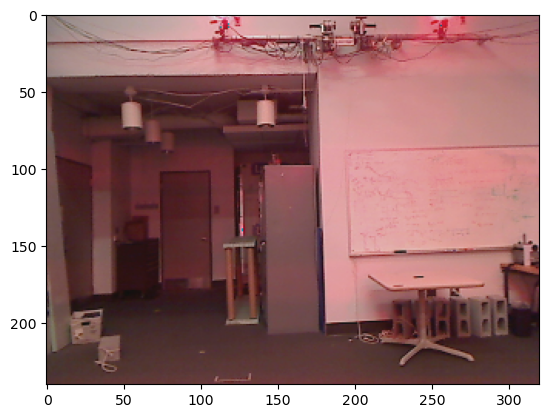

In [214]:
ind = 447
test_img = cam1data['cam'][...,ind]
rot = rots[...,np.argmin(np.abs(vicon_ts-cam_ts[ind]))]
plt.imshow(test_img)

In [258]:
test_img.shape

(240, 320, 3)

In [188]:
def asCartesian(rthetaphi):
    r       = rthetaphi[0]
    theta   = rthetaphi[1] # to radian
    phi     = rthetaphi[2]
    x = r * np.sin( theta ) * np.cos( phi )
    y = r * np.sin( theta ) * np.sin( phi )
    z = r * np.cos( theta )
    return [x,y,z]

def asCartesian(rthetaphi):
    r       = rthetaphi[0]
    theta   = rthetaphi[1] # to radian
    phi     = rthetaphi[2]
    x = r * np.sin( theta ) * np.cos( phi )
    y = r * np.sin( theta ) * np.sin( phi )
    z = r * np.cos( theta )
    return [x,y,z]


def asSpherical(xyz):
    #takes list xyz (single coord)
    x       = xyz[0]
    y       = xyz[1]
    z       = xyz[2]
    r       =  np.linalg.norm(xyz)
    theta   =  np.arccos(z/r) #to degrees
    phi     =  np.arctan2(y,x)
    return [r,theta,phi]

def toCylinder(rthetaphi):
    r       = rthetaphi[0]
    theta   = rthetaphi[1]
    phi     = rthetaphi[2]
    lam = (np.pi/2)-theta
    h = phi
    return([r,phi,h])

def toUnrolledCylinder(rthetaphi,height=960,width=1920):
    r       = rthetaphi[0]
    theta   = rthetaphi[1]
    phi     = rthetaphi[2]
    lam = theta
    wx = np.pi+phi; hy =lam
    x = int((wx)*(width/(2*np.pi)))
    y = int((hy)*(height/(np.pi)))
    return([x,y])



In [189]:
# np.array(np.meshgrid(np.linspace(0,10,10),np.linspace(10,15,5))).transpose(1,2,0)

In [215]:
latlin = np.linspace(np.pi/6,-np.pi/6,320)
lonlin = np.linspace(-np.pi/8,np.pi/8,240)
sph_mesh = np.array(np.meshgrid(latlin,lonlin))
rho = np.ones_like(lat)

sph_coords = (sph_mesh).transpose(1,2,0)
cart_coords = np.apply_along_axis(lambda x: [np.cos(x[1])*np.cos(x[0]),-np.cos(x[1])*np.sin(x[0]),-np.sin(x[1])],-1,sph_coords)
# canvas = np.ones((960,1920,3),dtype='uint8')*255

In [191]:
rots[...,1]

array([[ 0.99848492,  0.05447123, -0.00779417],
       [-0.054393  ,  0.99847032,  0.00992047],
       [ 0.00832263, -0.0094815 ,  0.99992041]])

In [192]:
rot@cart_coords.reshape(-1,3).T

array([[ 0.70389973,  0.70571983,  0.70753199, ...,  0.88127463,
         0.88011246,  0.87894114],
       [-0.57228817, -0.56987301, -0.56745184, ...,  0.36436019,
         0.36716156,  0.3699591 ],
       [ 0.42072725,  0.42095639,  0.4211851 , ..., -0.30099282,
        -0.30098911, -0.30098628]])

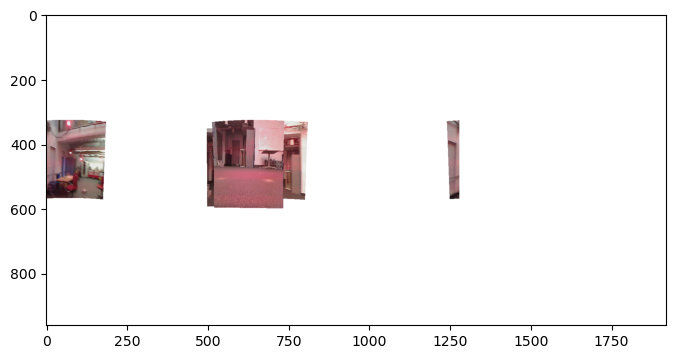

In [199]:
# canvas = np.ones((960,1920,3),dtype='uint8')*255
fig, axes = plt.subplots(1, 1, figsize=(8,12))
axes.imshow(canvas)
fig.canvas.draw()

i=90
img = cam1data['cam'][...,i]
nearest_idx = np.argmin(np.abs(vicon_ts-cam_ts[i]))
rot = rots[...,nearest_idx]

# rot_cart_coords = np.apply_along_axis(lambda x: transforms3d.quaternions.rotate_vector(x,qt),-1,cart_coords)
rot_cart_coords = np.apply_along_axis(lambda x: rot@x,-1,cart_coords)
rot_sph_coords = np.apply_along_axis(lambda x: [np.arcsin(-x[2]/np.linalg.norm(x)),np.arctan2(x[1],x[0]),np.linalg.norm(x)],-1,rot_cart_coords)
canvas_coords = np.apply_along_axis(lambda x: np.array([(x[0]+(np.pi/2))*(960/np.pi),(x[1]+(np.pi))*(1280/(2*np.pi))]).astype(int),-1,rot_sph_coords)
canvas[canvas_coords[...,0],canvas_coords[...,1]] = img
axes.imshow(canvas)
fig.canvas.draw()

In [213]:
rot_cart_coords.shape

(240, 320, 3)

In [209]:
canvas = np.ones((960,1280,3),dtype='uint8')*255
for i in tqdm(range(0,cam1data['cam'].shape[-1],20)):
    img = cam1data['cam'][...,i]
    nearest_idx = np.argmin(np.abs(vicon_ts-cam_ts[i]))
    rot = rots[...,nearest_idx]

    # rot_cart_coords = np.apply_along_axis(lambda x: transforms3d.quaternions.rotate_vector(x,qt),-1,cart_coords)
    # rot_cart_coords = np.apply_along_axis(lambda x: rot@x,-1,cart_coords)
    # rot_sph_coords = np.apply_along_axis(lambda x: asSpherical(x),-1,rot_cart_coords)
    # canvas_coords = np.apply_along_axis(lambda x: toUnrolledCylinder(x),-1,rot_sph_coords)
    # canvas[canvas_coords.reshape((-1,2))[:,1],canvas_coords.reshape((-1,2))[:,0]] = img.reshape((-1,3))

    # rot_cart_coords = np.apply_along_axis(lambda x: transforms3d.quaternions.rotate_vector(x,qt),-1,cart_coords)
    rot_cart_coords = np.apply_along_axis(lambda x: rot@x,-1,cart_coords)
    rot_sph_coords = np.apply_along_axis(lambda x: [np.arcsin(-x[2]/np.linalg.norm(x)),np.arctan2(x[1],x[0]),np.linalg.norm(x)],-1,rot_cart_coords)
    canvas_coords = np.apply_along_axis(lambda x: np.array([(x[0]+(np.pi/2))*(960/np.pi),(x[1]+(np.pi))*(1280/(2*np.pi))]).astype(int),-1,rot_sph_coords)
    canvas[canvas_coords[...,0],canvas_coords[...,1]] = img


  0%|          | 0/48 [00:00<?, ?it/s]

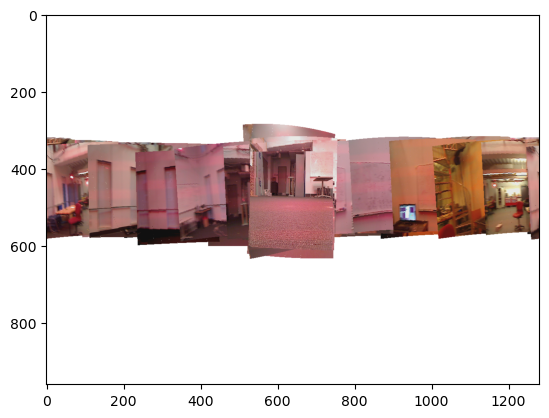

In [211]:
fig, axes = plt.subplots(1, 1)
axes.imshow(canvas)


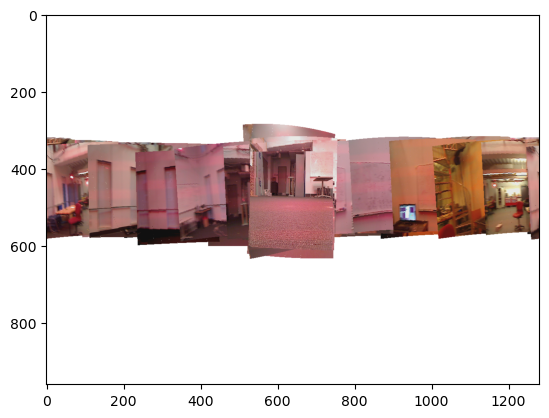

In [210]:
# plt.imshow(canvas)
plt.imshow(canvas)

In [218]:
FIGURES_FOLDER = "./figures/"

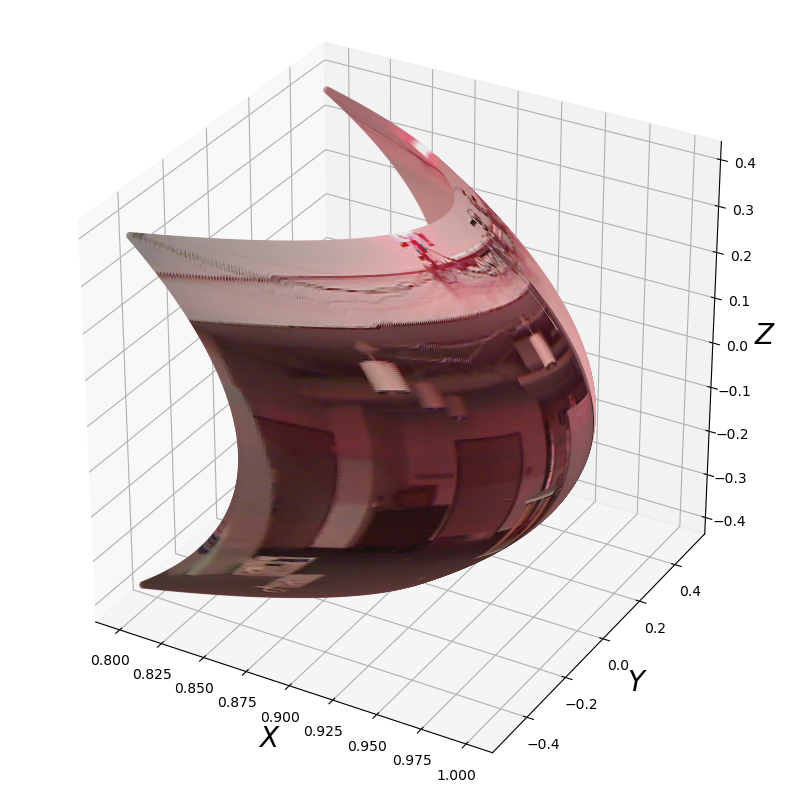

In [219]:
%matplotlib inline
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
ax.set_box_aspect((1,1,1))
ax.scatter(cart_coords.reshape(-1,3)[:,0],cart_coords.reshape(-1,3)[:,1],cart_coords.reshape(-1,3)[:,2], color = test_img.reshape((-1,3))/255.0)
ax.set_xlabel('$X$', fontsize=20)
ax.set_ylabel('$Y$', fontsize=20)
ax.set_zlabel('$Z$', fontsize=20)
fig.savefig(f'{FIGURES_FOLDER}_3D_CartCoord.jpg')

In [50]:
transforms3d.axangles.mat2axangle(rot)

(array([-0.03563513, -0.6949868 ,  0.71813891]), 0.04398628350422)

In [220]:
rot_cart_coords = np.apply_along_axis(lambda x: rot@x,-1,cart_coords)

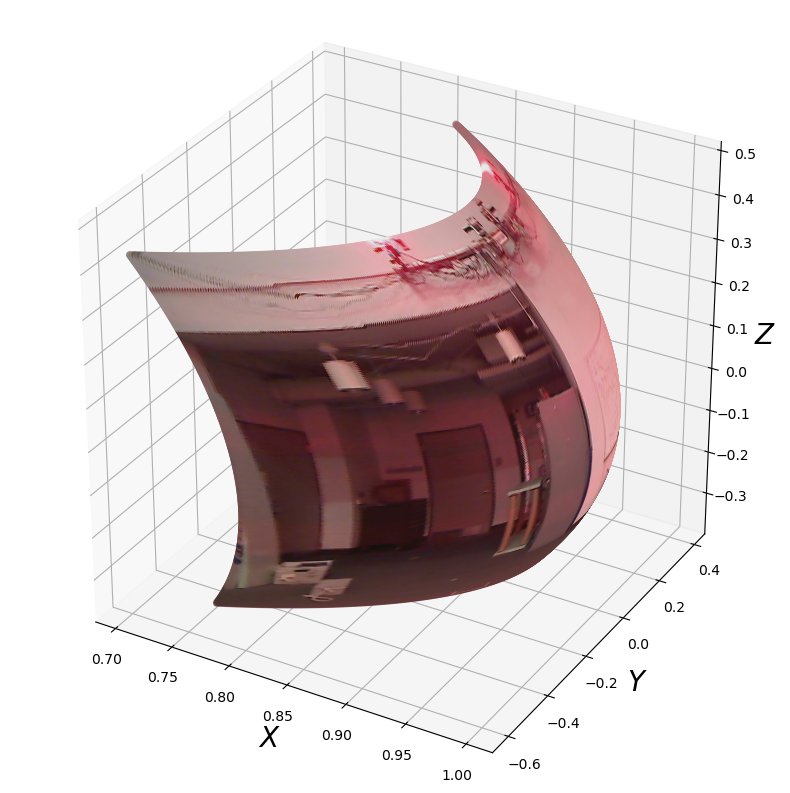

In [222]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
ax.set_box_aspect((1,1,1))
ax.scatter(rot_cart_coords.reshape(-1,3)[:,0],rot_cart_coords.reshape(-1,3)[:,1],rot_cart_coords.reshape(-1,3)[:,2],color = test_img.reshape((-1,3))/255.0)
ax.set_xlabel('$X$', fontsize=20)
ax.set_ylabel('$Y$', fontsize=20)
ax.set_zlabel('$Z$', fontsize=20)
fig.savefig(f'{FIGURES_FOLDER}3D_RotatedCartCoord.jpg')

In [82]:
test_img.reshape((-1,3))/255.0

array([[0.30196078, 0.18039216, 0.18431373],
       [0.29803922, 0.16470588, 0.17254902],
       [0.29803922, 0.16078431, 0.16862745],
       ...,
       [0.35686275, 0.17254902, 0.18039216],
       [0.34509804, 0.17647059, 0.17254902],
       [0.34509804, 0.17647059, 0.17647059]])

In [76]:
rot_sph_coords = np.apply_along_axis(lambda x: asSpherical(x),-1,rot_cart_coords)

In [147]:
def toCylinder(rthetaphi):
    r       = rthetaphi[0]
    theta   = rthetaphi[1]
    phi     = rthetaphi[2]
    lam = (np.pi/2)-theta
    h = phi
    return([r,phi,h])

def toUnrolledCylinder(rthetaphi,height=960,width=1280):
    r       = rthetaphi[0]
    theta   = rthetaphi[1]
    phi     = rthetaphi[2]
    lam = (np.pi/2)-theta
    wx = phi; hy =lam
    x = int((wx%(2*np.pi))*(1280/(2*np.pi)))
    y = int((hy%(np.pi))*(960/(np.pi)))
    return([x,y])

    


In [148]:
cyl_coords = np.apply_along_axis(lambda x: toCylinder(x),-1,rot_sph_coords)


In [149]:
canvas_coords = np.apply_along_axis(lambda x: toUnrolledCylinder(x),-1,rot_sph_coords)

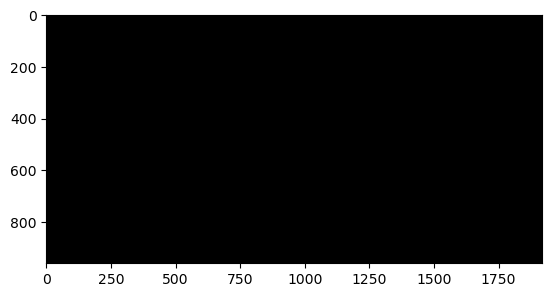

In [156]:
canvas = np.zeros((960,1920,3),dtype='uint8')
plt.imshow(canvas)

In [157]:
canvas[canvas_coords.reshape((-1,2))[:,1],canvas_coords.reshape((-1,2))[:,0]] = test_img.reshape((-1,3))

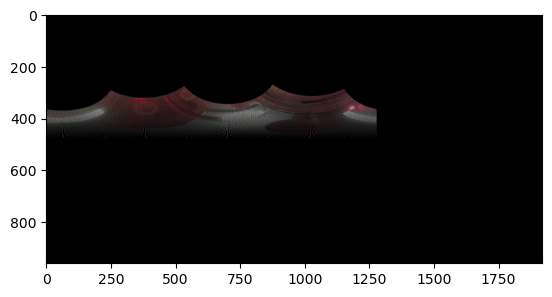

In [158]:
plt.imshow(canvas)

In [136]:
test_img.shape

(240, 320, 3)

In [137]:
canvas_coords.shape

(240, 320, 2)

In [142]:
a = np.array([1,2,2,6,7])
a[[0,4,4,2]] = np.array([11,22,121,1122])
a

array([  11,    2, 1122,    6,  121])

In [208]:
read_data(f'../data/testset/imu/imuRaw{11}.p')['ts']

array([[1.29777435e+09, 1.29777435e+09, 1.29777435e+09, ...,
        1.29777440e+09, 1.29777440e+09, 1.29777440e+09]])

# Plotting

In [264]:
PICKLES_FOLDER = "./pickles/"
QT_PICKLE_PREFIX = "qts_2023_02_08T19_45_45_test_"
IMU_TEST_FOLDER = "../data/testset/imu/"


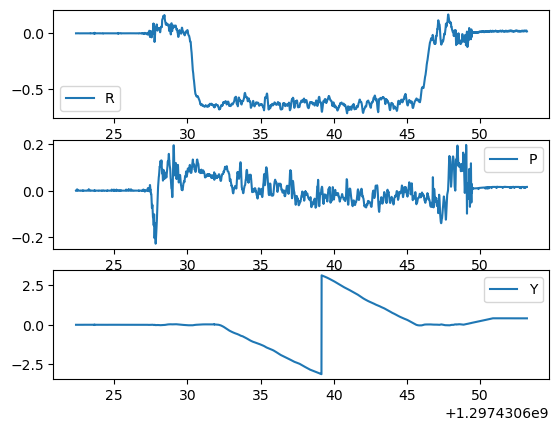

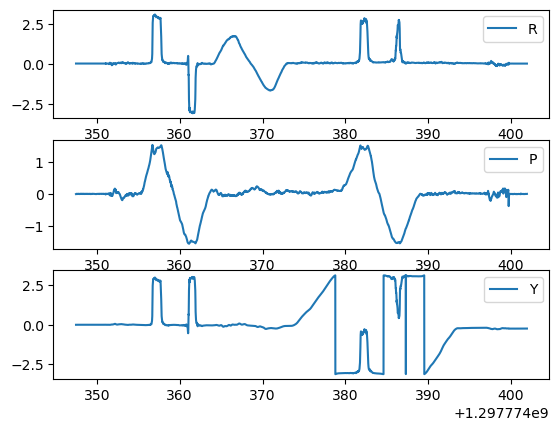

In [271]:
for i,exp in enumerate([10,11]):
    qts_test = np.load(f'{PICKLES_FOLDER}{QT_PICKLE_PREFIX}{exp}.npy')
    imudata = read_data(f'{IMU_TEST_FOLDER}imuRaw{exp}.p')
    fig, axes = plt.subplots(3, 1)

    imuEulers = []
    for qt in np.array(qts_test):
        imuEulers+=[transforms3d.euler.quat2euler(qt)]
    imuEulers = np.vstack(imuEulers)
    for i,rpy in enumerate(['R','P','Y']):
        # axes.flatten()[i].plot(imu1data['ts'][0],imuEulers[:,i])    
        axes.flatten()[i].plot(imudata['ts'][0],imuEulers[:,i],label=rpy)
        axes.flatten()[i].legend()   
    fig.savefig(f'{FIGURES_FOLDER}optimisedRPY_test_SET_{exp}')

    

    # axes.flatten()[i].axis('off')
# fig.tight_layout()
# fig.savefig(f'{FIGURES_FOLDER}motionModelVerification.jpg')


In [223]:
FIGURES_FOLDER = "./figures/"

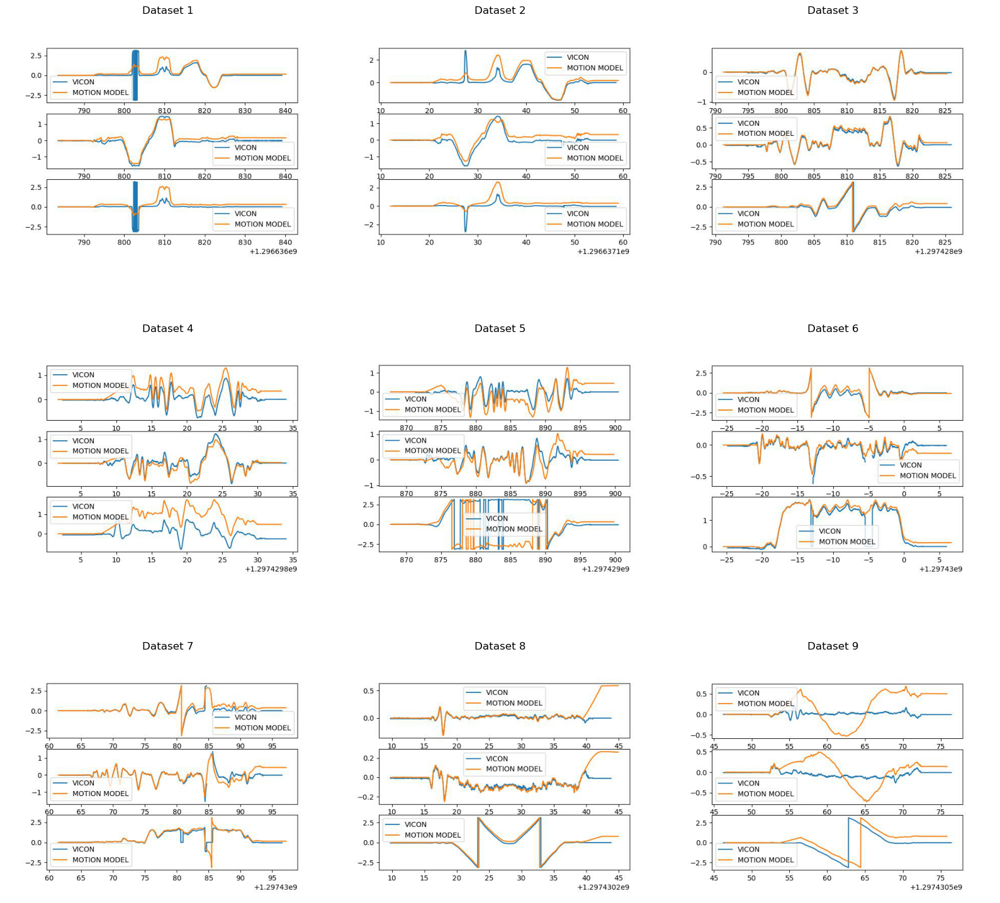

In [239]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(3, 3, figsize=(16,16))
for i in range(1,10):
    axes.flatten()[i-1].imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{i}.jpg'))
    axes.flatten()[i-1].axis('off')
    axes.flatten()[i-1].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}motionModelVerification.jpg')


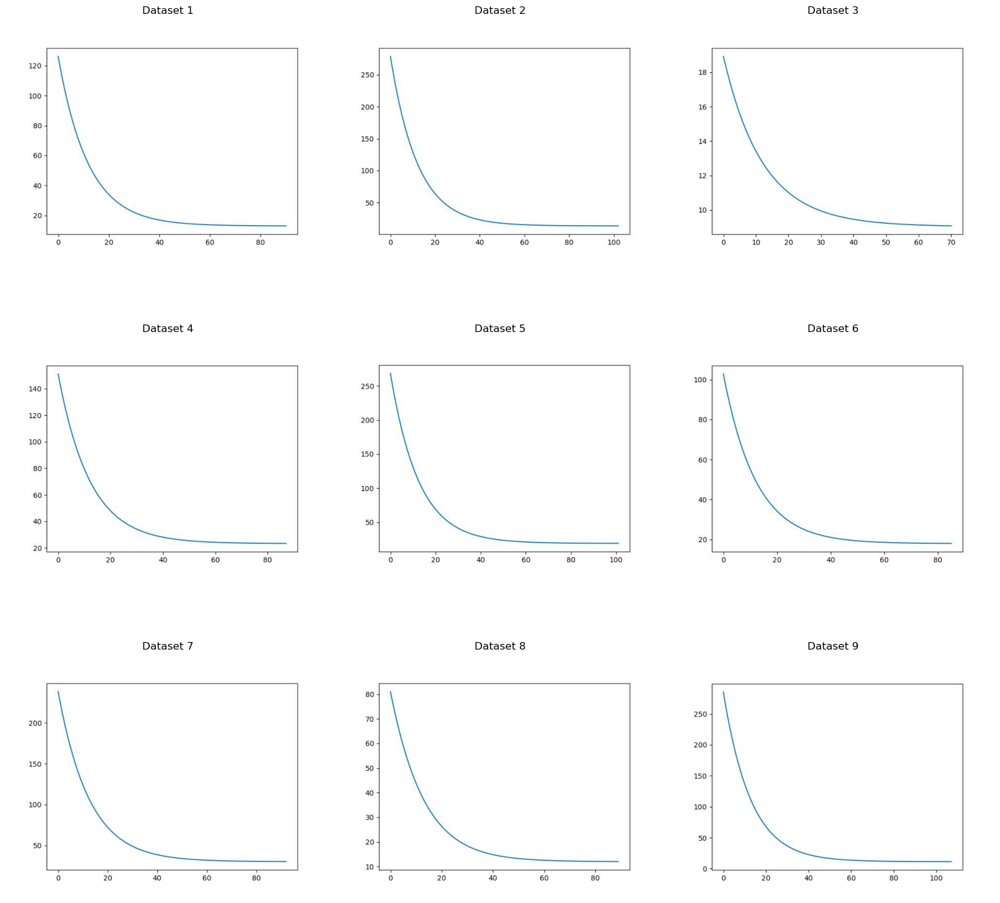

In [241]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(3, 3, figsize=(16,16))
for i in range(1,10):
    axes.flatten()[i-1].imshow(Image.open(f'{FIGURES_FOLDER}GradDesc_costfn_2023_02_08T01_15_04_SET_{i}.jpg'))
    axes.flatten()[i-1].axis('off')
    axes.flatten()[i-1].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}GradientDescent.jpg')


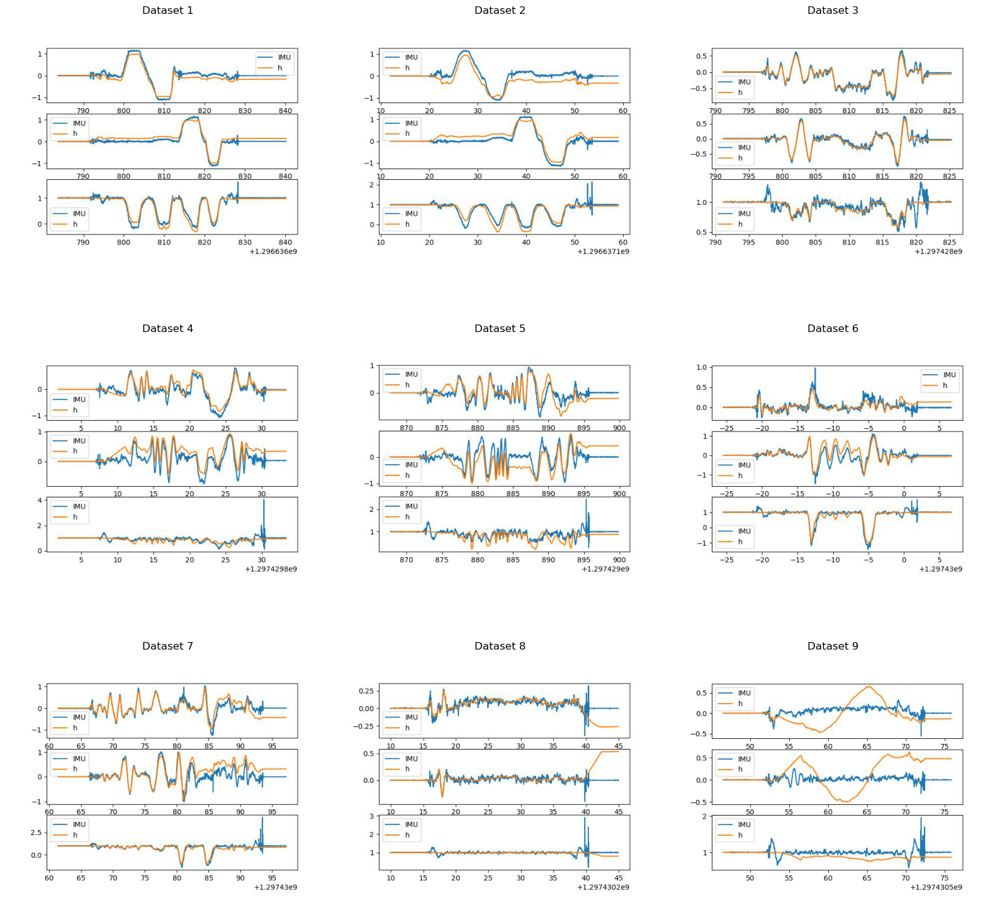

In [243]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(3, 3, figsize=(16,16))
for i in range(1,10):
    axes.flatten()[i-1].imshow(Image.open(f'{FIGURES_FOLDER}AccVerification_2023_02_08T01_15_04_SET_{i}.jpg'))
    axes.flatten()[i-1].axis('off')
    axes.flatten()[i-1].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}AccVerification.jpg')


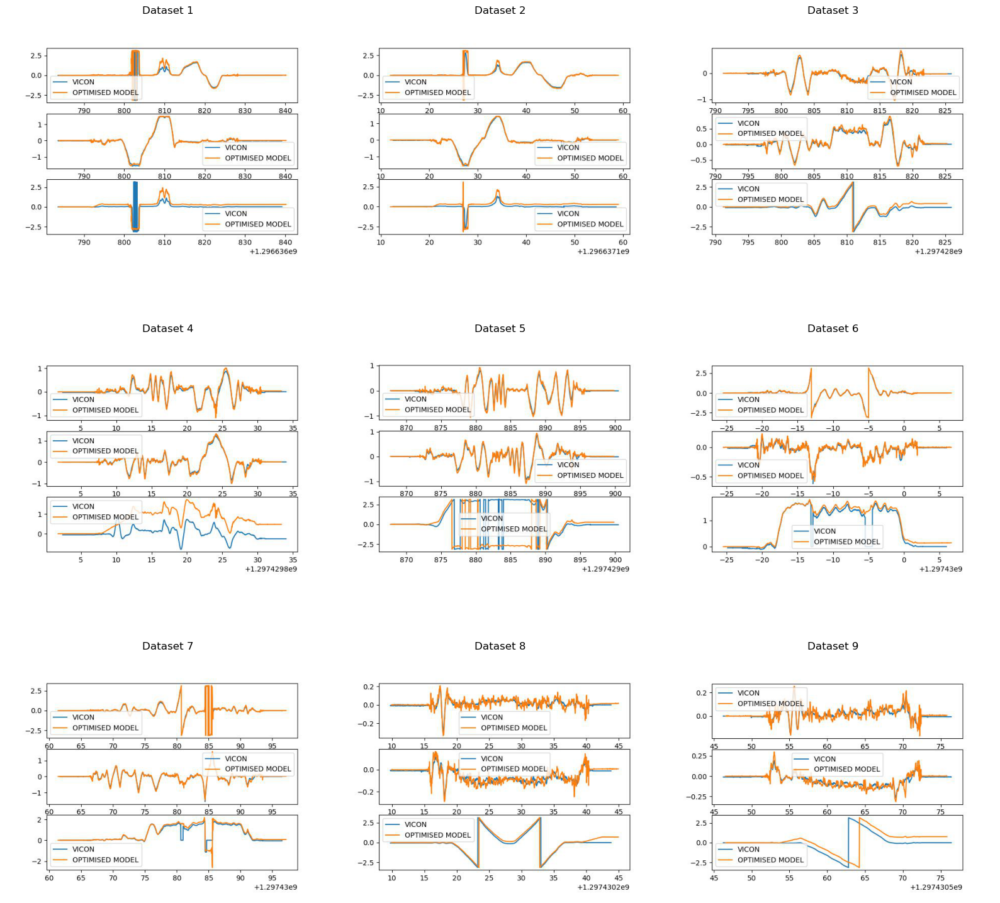

In [245]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(3, 3, figsize=(16,16))
for i in range(1,10):
    axes.flatten()[i-1].imshow(Image.open(f'{FIGURES_FOLDER}OptimisedComparison_2023_02_08T01_15_04_SET_{i}.jpg'))
    axes.flatten()[i-1].axis('off')
    axes.flatten()[i-1].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}OptimisedComaprison.jpg')


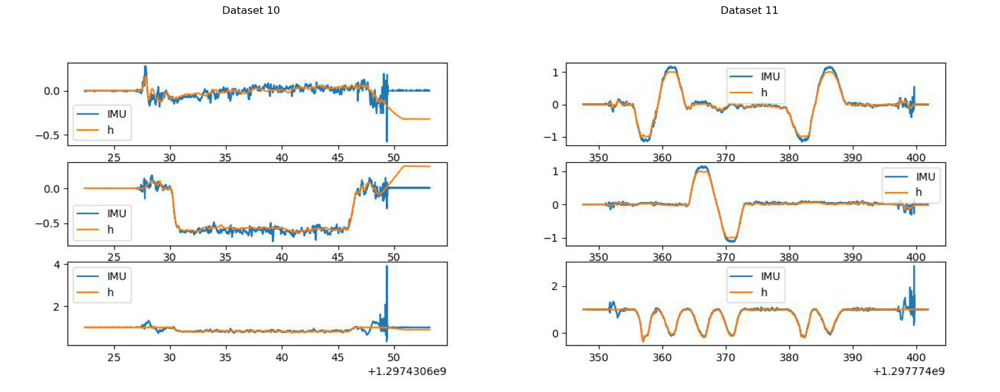

In [248]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(1, 2, figsize=(16,16))
for i in range(10,12):
    axes.flatten()[i-10].imshow(Image.open(f'{FIGURES_FOLDER}AccVerification_2023_02_08T19_45_45_test_SET_{i}.jpg'))
    axes.flatten()[i-10].axis('off')
    axes.flatten()[i-10].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}AccVerificationTest.jpg')


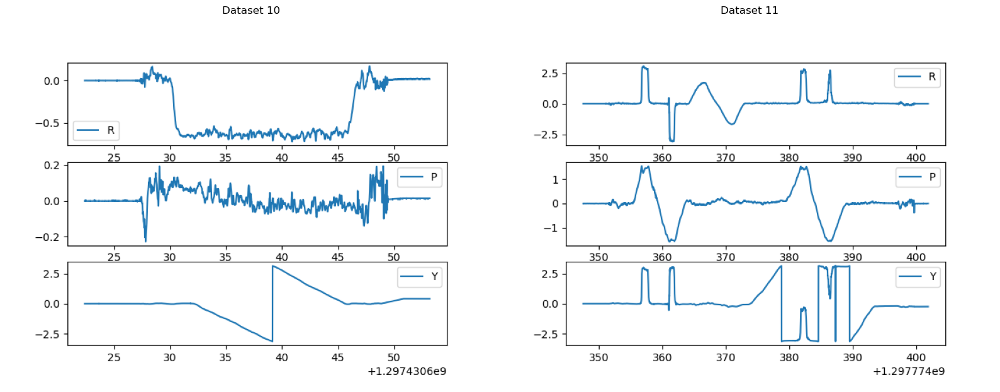

In [275]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(1, 2, figsize=(16,16))
for i in range(10,12):
    axes.flatten()[i-10].imshow(Image.open(f'{FIGURES_FOLDER}optimisedRPY_test_SET_{i}.png'))
    axes.flatten()[i-10].axis('off')
    axes.flatten()[i-10].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}OptimisedRPYTest.jpg')


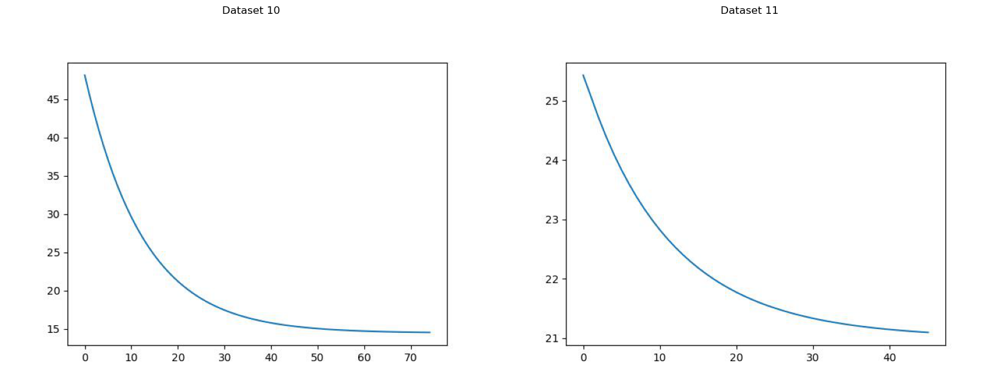

In [249]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(1, 2, figsize=(16,16))
for i in range(10,12):
    axes.flatten()[i-10].imshow(Image.open(f'{FIGURES_FOLDER}GradDesc_costfn_2023_02_08T19_45_45_test_SET_{i}.jpg'))
    axes.flatten()[i-10].axis('off')
    axes.flatten()[i-10].set_title(f'Dataset {i}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}GradientDescentTest.jpg')


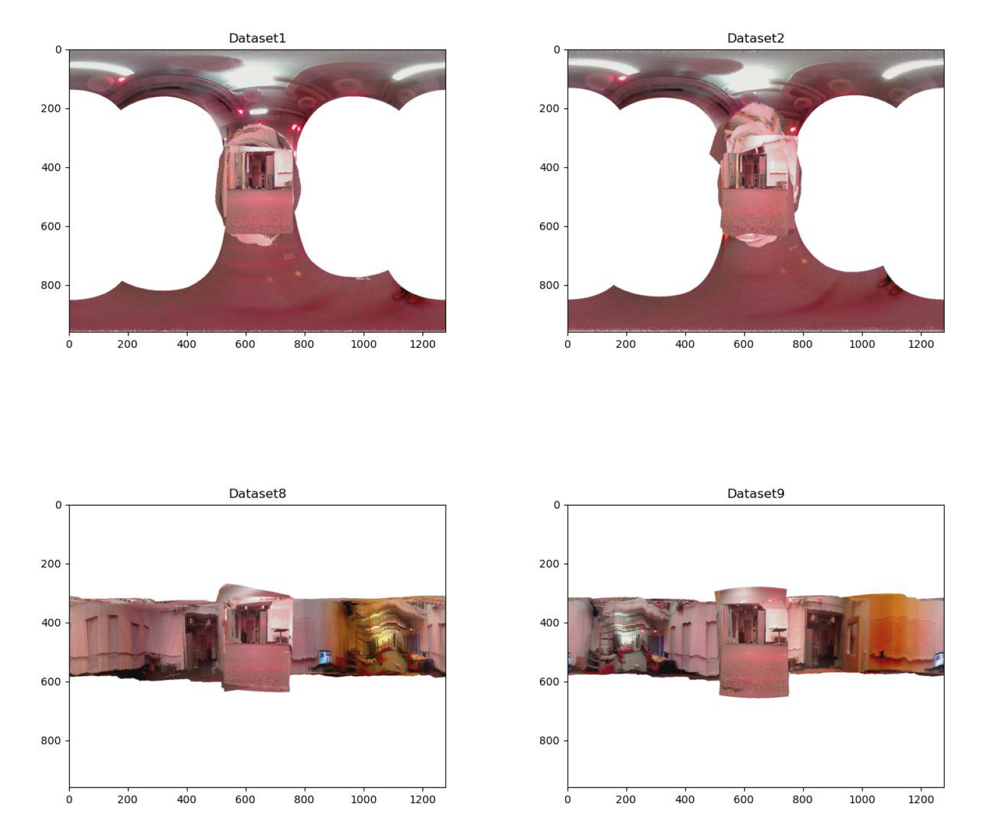

In [253]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(2, 2, figsize=(16,16))
for i,exp in enumerate([1,2,8,9]):
    axes.flatten()[i].imshow(Image.open(f'{FIGURES_FOLDER}panorama_2023_02_09T23_12_30_train_SET_{exp}.jpg'))
    axes.flatten()[i].axis('off')
    # axes.flatten()[i].set_title(f'Dataset {exp}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}Panorama.jpg')


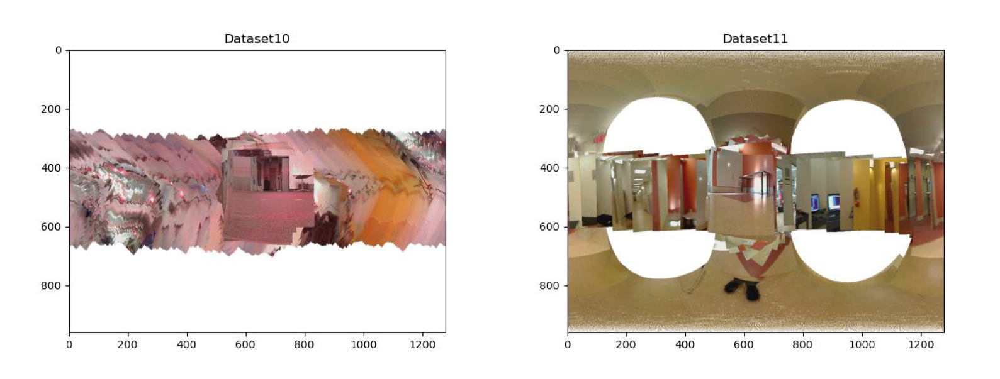

In [257]:
from PIL import Image
# plt.imshow(Image.open(f'{FIGURES_FOLDER}motionModelVerification_2023_02_08T01_15_04_SET_{9}.jpg'))
# plt.axis('off')

fig, axes = plt.subplots(1, 2, figsize=(16,8))
for i,exp in enumerate([10,11]):
    axes.flatten()[i].imshow(Image.open(f'{FIGURES_FOLDER}panorama_2023_02_10T01_20_08_test_SET_{exp}.jpg'))
    axes.flatten()[i].axis('off')
    # axes.flatten()[i].set_title(f'Dataset {exp}')
fig.tight_layout()
fig.savefig(f'{FIGURES_FOLDER}PanoramaTest.jpg')
